In [1]:
%matplotlib inline
import sys, os, glob

from astropy.io import fits, ascii

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from astropy import units as u
from astropy.table import Table
import astropy.constants as const
from astropy.coordinates import SkyCoord, concatenate
from astropy import table

from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

import scipy.stats as st
from scipy.optimize import minimize

import emcee
import corner

from scipy.special import erf, gamma, gammainc

In [2]:
import scienceplots

plt.style.use(['science', 'no-latex', 'notebook', 'light'])

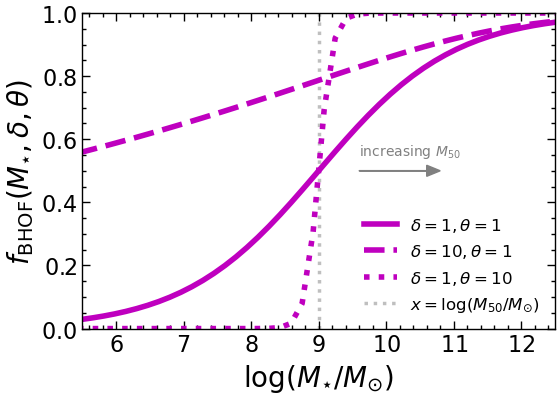

In [3]:

fig, ax = plt.subplots(1, 1, figsize=(5.8, 4.2))

x_eval = np.linspace(5, 13)

delta = 1
theta2 = 1
x50 = 9
focc = 1/(1 + delta * np.exp(-theta2*(x_eval - x50)))**(1/delta)
ax.plot(x_eval, focc, label=r'$\delta=1, \theta=1$', lw=4, color='m')

delta = 10
theta2 = 1
focc = 1/(1 + delta * np.exp(-theta2*(x_eval - x50)))**(1/delta)
ax.plot(x_eval, focc, label=r'$\delta=10, \theta=1$', lw=4, color='m', linestyle='dashed')

delta = 1
theta2 = 10
focc = 1/(1 + delta * np.exp(-theta2*(x_eval - x50)))**(1/delta)
ax.plot(x_eval, focc, label=r'$\delta=1, \theta=10$', lw=4, color='m', linestyle='dotted')

ax.axvline(x50, label=r'$x=\log(M_{50}/M_{\odot})$', color='gray', lw=2.5, zorder=-1, linestyle='dotted', alpha=0.5)

ax.set_xlim(5.5, 12.5)
ax.set_ylim(0, 1)

ax.legend(fontsize=12, loc='lower right')
ax.set_xlabel(r'$\log(M_{\star}/M_{\odot})$', fontsize=20)
ax.set_ylabel(r'$f_{\rm{BHOF}}(M_{\star}, \delta, \theta)$', fontsize=20)

ax.arrow(9.6, 0.5, 1, 0, lw=1, head_width=.035, head_length=.2, color='gray')
ax.text(9.6, 0.55, 'increasing $M_{50}$', color='gray')

fig.tight_layout()
fig.savefig('bohf.pdf', dpi=300)

In [4]:
def f_x(x, x0, f_a=1, delta=1, theta2=2.5):

    # Occupation function (Miller 2015)
    focc = 1/(1 + delta * np.exp(-theta2*(x - x0)))**(1/delta)

    return np.clip(f_a*focc, 1e-8, 1)

def f_r(x, x0, f_a=1, delta=1, theta2=2.5):

    # Occupation function (Miller 2015)
    focc = 1/(1 + delta * np.exp(-theta2*(x - x0)))**(1/delta)
    
    return np.clip(f_a * focc, 1e-8, 1)

def f_o(x, x0, alpha, beta, f_a=1, l0=30, xi=0.23, a=0.52, delta=1, theta2=2.5):
    
    # Type 1 function (Oh 2015; https://ui.adsabs.harvard.edu/abs/2015ApJS..219....1O/abstract)
    L =  10**(26 + alpha + beta*x)
    L0 = 10**(l0 + 26)
    f1 = 1 - (1 + 3*(L/L0)**(1 - 2*xi))**-a

    # Occupation function (Miller 2015)
    focc = 1/(1 + delta * np.exp(-theta2*(x - x0)))**(1/delta)
    
    return np.clip(f_a * f1 * focc, 1e-8, 1)

In [83]:
def log_likelihood_x(theta, x, y, xerr, yerr, logSFR, logSFRerr, xp, yp, d25, n, p_obs):
    
    # parameters to be fit
    log_ms0, alpha, beta, log_f, f_a, log_delta, theta2 = theta
    delta = np.exp(log_delta)

    mask_det = (yerr > 0)

    sigma_HX = 0.4

    # Residuals
    s2 = np.full(len(mask_det), np.exp(2*log_f)**2 + (beta*xerr)**2)
    s2[mask_det] = yerr[mask_det]**2 + np.exp(2*log_f)**2 + (beta*xerr[mask_det])**2 + logSFRerr[mask_det]**2

    # XRB residuals
    s2_XRB = np.full(len(mask_det), np.exp(2*log_f)**2 + xerr**2)
    s2_XRB[mask_det] = sigma_HX**2 + yerr[mask_det]**2 + xerr[mask_det]**2

    L_HX = 9.05*1e28 * 10**(x+xp) + 1.62*1e39 * 10**logSFR

    r_match = 1*u.arcsec ###

    b = 2*n - 1/3
    logL_HX = np.log10(L_HX) - yp + np.log10(gammainc(2*n, b*(r_match.to(u.arcsec).value/(d25/2))**1/n)/gamma(2*n))

    # p(y|x) _BH
    f = st.norm.pdf((y - alpha - beta*x), scale=np.sqrt(s2))

    # Either the source is an XRB or a BH
    p_XRB = st.norm.sf(y - logL_HX, scale=np.sqrt(s2_XRB)) #
    
    # Likelihood
    S = st.norm.sf(-(y - alpha - beta*x), scale=np.sqrt(s2))

    # Occupation
    f_BHOF = f_x(x+xp, log_ms0+xp, f_a, delta, theta2)
    
    # Probability distributions
    p_det = (1 - p_XRB[mask_det]) * f_BHOF[mask_det] * f[mask_det]

    # Numerical integration
    dyI = 0.1 # Change this to make sure nothing bad happens
    #mask_pSF = p_XRB > 1e-40 # Short-cut
    mask_pSF = logL_HX < 5*s2_XRB + alpha + beta*x
    I = np.ones_like(f_BHOF)
    I[~mask_det & mask_pSF] = [np.trapz((1 - st.norm.sf(np.arange(-10, yi, dyI) - logL_HX[~mask_det & mask_pSF][i], scale=np.sqrt(s2_XRB[~mask_det & mask_pSF][i])))*st.norm.pdf((np.arange(-10, yi, dyI) - alpha - beta*x[~mask_det & mask_pSF][i]), scale=np.sqrt(s2[~mask_det & mask_pSF][i])), dx=dyI) for i, yi in enumerate(y[~mask_det & mask_pSF])]
    I[~mask_det & ~mask_pSF] = S[~mask_det & ~mask_pSF]
    p_cens = f_BHOF[~mask_det] * I[~mask_det] + (1 - f_BHOF[~mask_det])

    # Clip
    p_det = np.clip(p_det, 1e-18, 1)
    p_cens = np.clip(p_cens, 1e-18, 1)
    
    # Likelihood
    ll_det = np.log(p_obs[mask_det] * p_det)
    ll_cens = np.log(p_obs[~mask_det] * p_cens)

    ll = np.sum(ll_det) + np.sum(ll_cens) 
    
    return ll

def log_likelihood_r(theta, x, y, xerr, yerr, logLIR, logLIRerr, xp, yp, d25, n, p_obs):

    mask_det = (yerr > 0)

    sigma_HX = 0.3

    r_match = 1*u.arcsec ###

    # parameters to be fit
    log_ms0, alpha, beta, log_f, f_a, log_delta, theta2 = theta
    delta = np.exp(log_delta)
    
    # Residuals
    s2 = yerr**2 + np.exp(2*log_f)**2 + (beta*xerr)**2
    s_ul2 = np.exp(2*log_f)**2 + (beta*xerr)**2

    # XRB residuals
    s2_SF = np.full(len(mask_det), sigma_HX**2 + xerr**2)
    s2_SF[mask_det] = sigma_HX**2 + yerr[mask_det]**2 + xerr[mask_det]**2 + logLIRerr[mask_det]**2

    # p(y|x)
    f = st.norm.pdf((y - alpha - beta*x), scale=np.sqrt(s2))

    q_TIR = 1.4
    b = 2*n - 1/3
    logL_SF = logLIR - q_TIR - yp + np.log10(gammainc(2*n, b*(r_match.to(u.arcsec).value/(d25/2))**1/n)/gamma(2*n))

    # Either the source is an XRB or a BH
    p_SF = st.norm.sf(y - logL_SF, scale=np.sqrt(s2_SF))

    # Likelihood
    S = st.norm.sf(-(y - alpha - beta*x), scale=np.sqrt(s_ul2))

    f_BHOF = f_r(x+xp, log_ms0+xp, f_a, delta, theta2)

    # Probability distributions
    p_det = (1 - p_SF[mask_det]) * f_BHOF[mask_det] * f[mask_det]
    
    # Numerical integration
    dyI = 0.1 # Change this to make sure nothing bad happens
    mask_pSF = logL_SF < 5*s2_SF + alpha + beta*x # Short-cut
    I = np.ones_like(f_BHOF)
    I[~mask_det & mask_pSF] = [np.trapz((1 - st.norm.sf(np.arange(-10, yi, dyI) - logL_SF[~mask_det & mask_pSF][i], scale=np.sqrt(s2_SF[~mask_det & mask_pSF][i])))*st.norm.pdf((np.arange(-10, yi, dyI) - alpha - beta*x[~mask_det & mask_pSF][i]), scale=np.sqrt(s2[~mask_det & mask_pSF][i])), dx=dyI) for i, yi in enumerate(y[~mask_det & mask_pSF])]
    I[~mask_det & ~mask_pSF] = S[~mask_det & ~mask_pSF]
    p_cens = f_BHOF[~mask_det] * I[~mask_det] + (1 - f_BHOF[~mask_det])
    
    # Clip
    p_det = np.clip(p_det, 1e-12, 1)
    p_cens = np.clip(p_cens, 1e-12, 1)
    
    # Likelihood
    ll_det = np.log(p_obs[mask_det] * p_det)
    ll_cens = np.log(p_obs[~mask_det] * p_cens)

    ll = np.sum(ll_det) + np.sum(ll_cens)
    
    return ll

def log_likelihood_o(theta, x, y, xerr, yerr, xp, p_obs):

    # parameters to be fit
    log_ms0, alpha, beta, log_f, f_a, l0, xi, a, log_delta, theta2 = theta
    delta = np.exp(log_delta)
    
    # Residuals
    s2 = yerr**2 + np.exp(2*log_f)**2 + (beta*xerr)**2
    s_ul2 = np.exp(2*log_f)**2 + (beta*xerr)**2

    # p(y|x)
    f = st.norm.pdf((y - alpha - beta*x), scale=np.sqrt(s2))
    
    # Likelihood
    mask_det = (yerr > 0)
    S = st.norm.sf(-(y - alpha - beta*x), scale=np.sqrt(s_ul2))

    f_occ_det = f_o(x[mask_det]+xp, log_ms0+xp, alpha, beta, f_a, l0, xi, a, delta, theta2)
    f_occ_cens = f_o(x[~mask_det]+xp, log_ms0+xp, alpha, beta, f_a, l0, xi, a, delta, theta2)
        
    # Probability distributions
    p_det = f_occ_det * f[mask_det]
    p_cens = f_occ_cens * S[~mask_det] + 1 - f_occ_cens

    # Clip
    p_det = np.clip(p_det, 1e-12, 1)
    p_cens = np.clip(p_cens, 1e-12, 1)
    
    # Likelihood
    ll_det = np.log(p_obs[mask_det] * p_det)
    ll_cens = np.log(p_obs[~mask_det] * p_cens)

    ll = np.sum(ll_det) + np.sum(ll_cens)
    
    return ll

def log_likelihood_init(theta, x, y, xerr, yerr):
    
    # parameters to be fit
    alpha, beta, log_f = theta

    #if beta < 0:
    #    return -np.inf

    sigma2 = yerr**2 + np.exp(2*log_f)**2 + (beta*xerr)**2
    z = (y - alpha - beta*x)/np.sqrt(sigma2)
    
    mask_det = (yerr > 0)
    
    f = 1/np.sqrt(sigma2*2*np.pi)*np.exp(-z**2/2)
    
    ll = np.sum(np.log(f[mask_det]))
    
    return ll

In [62]:
def log_prior_x(theta):

    logms0, alpha, beta, log_f, f_a, log_delta, theta2 = theta
    # Priors
    if -5.0 < logms0 < 3.0 and -15.0 < alpha < 5.0 and 0.0 < beta < 5.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and -1 < log_delta < 4 and -5 < theta2 < 50:
      return 0.0
    return -np.inf

def log_prior_r(theta):

    logms0, alpha, beta, log_f, f_a, log_delta, theta2 = theta
    # Priors
    if -5.0 < logms0 < 3.0 and -5.0 < alpha < 5.0 and 0.0 < beta < 5.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and -1 < log_delta < 10 and -5 < theta2 < 50:
      return 0.0
    return -np.inf

def log_prior_o(theta):

    logms0, alpha, beta, log_f, f_a, l0, xi, a, log_delta, theta2 = theta
    # Priors
    if -5.0 < logms0 < 3.0 and -5.0 < alpha < 5.0 and 0.0 < beta < 5.0 and -2.0 < log_f < 1.0 and 0 < f_a < 1 and -0.45 < xi < 0.45 and -5 < l0 < 40 and 0.05 < a < .95 and -2 < log_delta < 6 and 0 < theta2 < 6:
      return np.log(st.norm.pdf(a, 0.52, 0.05)) + np.log(st.norm.pdf(xi, 0.23, 0.02))
    return -np.inf

def log_probability_x(theta, x, y, xerr, yerr, logSFR, logSFRerr, xp, yp, d25, n, p_obs):
    lp = log_prior_x(theta)
    ll = log_likelihood_x(theta, x, y, xerr, yerr, logSFR, logSFRerr, xp, yp, d25, n, p_obs)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

def log_probability_r(theta, x, y, xerr, yerr, logLIR, logLIRerr, xp, yp, d25, n, p_obs):
    lp = log_prior_r(theta)
    ll = log_likelihood_r(theta, x, y, xerr, yerr, logLIR, logLIRerr, xp, yp, d25, n, p_obs)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

def log_probability_o(theta, x, y, xerr, yerr, xp, p_obs):
    lp = log_prior_o(theta)
    ll = log_likelihood_o(theta, x, y, xerr, yerr, xp, p_obs)
    if not np.isfinite(lp) or not np.isfinite(ll):
        return -np.inf
    return lp + ll

## Inference

In [11]:
os.environ["OMP_NUM_THREADS"] = "1"

#from multiprocessing import Pool
from multiprocess import Pool

from multiprocessing import cpu_count
ncpu = cpu_count() - 1
print("{0} CPUs".format(ncpu))

7 CPUs


In [84]:
# Read and combine data tables from other notebooks
dat_x = ascii.read('tcsc.txt')
dat_r = ascii.read('tvla.txt')
dat_o = ascii.read('tvar.txt')

nsamp=5000
nburn=100

def lp_comb(theta):
    theta_x = theta[:7]
    theta_r = np.concatenate(([theta[0]], theta[7:11], [theta[5], theta[6]]))
    theta_o = np.concatenate(([theta[0]], theta[11:], [theta[5], theta[6]]))
    return log_probability_x(theta_x, dat_x['x']-10, dat_x['y']-39, dat_x['xerr'], dat_x['yerr'], dat_x['logsfr'], dat_x['logsfrerr'], 10, 39, dat_x['d25'], dat_x['n'], dat_x['pobs']) +\
           log_probability_r(theta_r, dat_r['x']-10, dat_r['y']-37, dat_r['xerr'], dat_r['yerr'],  dat_r['loglir'], dat_r['loglirerr'], 10, 36.98,  dat_r['d25'], dat_r['n'], dat_r['pobs']) +\
           log_probability_o(theta_o, dat_o['x']-10, dat_o['y']-26.5, dat_o['xerr'], dat_o['yerr'], 10, dat_o['pobs'])

#np.random.seed(424)
def nll_init(theta, dat_x, dat_r, dat_o):
    theta_x = theta[:3]
    theta_r = theta[3:6]
    theta_o = theta[6:]
    return -(log_likelihood_init(theta_x, dat_x['x']-10, dat_x['y']-39, dat_x['xerr'], dat_x['yerr']) +\
             log_likelihood_init(theta_r, dat_r['x']-10, dat_r['y']-37, dat_r['xerr'], dat_r['yerr']) +\
             log_likelihood_init(theta_o, dat_o['x']-10, dat_o['y']-26.5, dat_o['xerr'], dat_o['yerr']))

initial = np.array([0.0, 0.5, np.log(0.2), 0.0, 0.5, np.log(0.2), 0.0, 0.5, np.log(0.2)])
initial += 1e-4 * np.random.randn(len(initial))
soln = minimize(nll_init, initial, args=(dat_x, dat_r, dat_o))

print('INIT DONE')

log_f_ml = -0.8

## TODO: There should only be one logms0, delta, theta

#     logms0, alpha, beta,    log_f,  f_a, delta, theta | alpha, beta,    log_f,  f_a     | alpha,      beta,     log_f, f_a, l0, xi, a
pos = [0, soln.x[0], 0.5, -0.8, 0.2, 1, 0,         soln.x[3], 0.8, -0.8, 0.98, soln.x[6], 0.4, -0.8, 0.95, 14, 0.2, 0.5]
pos = np.array(pos) + 1e-4 * np.random.randn(48, len(pos))
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lp_comb, pool=pool)
    sampler.run_mcmc(pos, nsamp, progress=True);

# Sampler
#sampler = emcee.EnsembleSampler(nwalkers, ndim, lp_comb, args=(dat_x, dat_r, dat_o))
#sampler.run_mcmc(pos, nsamp, progress=True);



INIT DONE


  0%|          | 0/5000 [00:00<?, ?it/s]/Users/colinburke/miniconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/Users/colinburke/miniconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
  0%|          | 1/5000 [00:21<29:30:55, 21.26s/it]/Users/colinburke/miniconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/Users/colinburke/miniconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
  0%|          | 2/5000 [00:42<29:33:49, 21.29s/it]/Users/colinburke/miniconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid 

In [96]:
np.save('samplessubmit', samples)

In [91]:
samples = sampler.get_chain()

flat_samples = sampler.get_chain(discard=3000, thin=5, flat=True)
print(flat_samples.shape)
#np.save('flatsamples', flat_samples)

(19200, 18)


In [27]:
flat_samples = np.load('flatsamples.npy')

In [ ]:
np.shape(flat_samples)

(67200, 18)

In [101]:
labels = [r"$\log(M_{\ast,0}/M_{\odot})$", r"$\alpha_{2{-}10\ {\rm keV}}$", r"$\beta_{2{-}10\ {\rm keV}}$", r"$\sigma_{2{-}10\ {\rm keV}}$", r'$f_{a, {2{-}10\ {\rm keV}}}$', r'$\delta$', r'$\theta$', r"$\alpha_{3\ {\rm{GHz}}}$", r"$\beta_{3\ {\rm{GHz}}}$", r"$\sigma_{3\ {\rm{GHz}}}$ [dex]", r'$f_{a, {3\ {\rm{GHz}}}}$', r"$\alpha_{\Delta R}$", r"$\beta_{\Delta R}$", r"$\sigma_{\Delta R}$ [dex]", r'$f_{a, \Delta R}$', r'$l_0$', r'$\xi$', r'$a$']


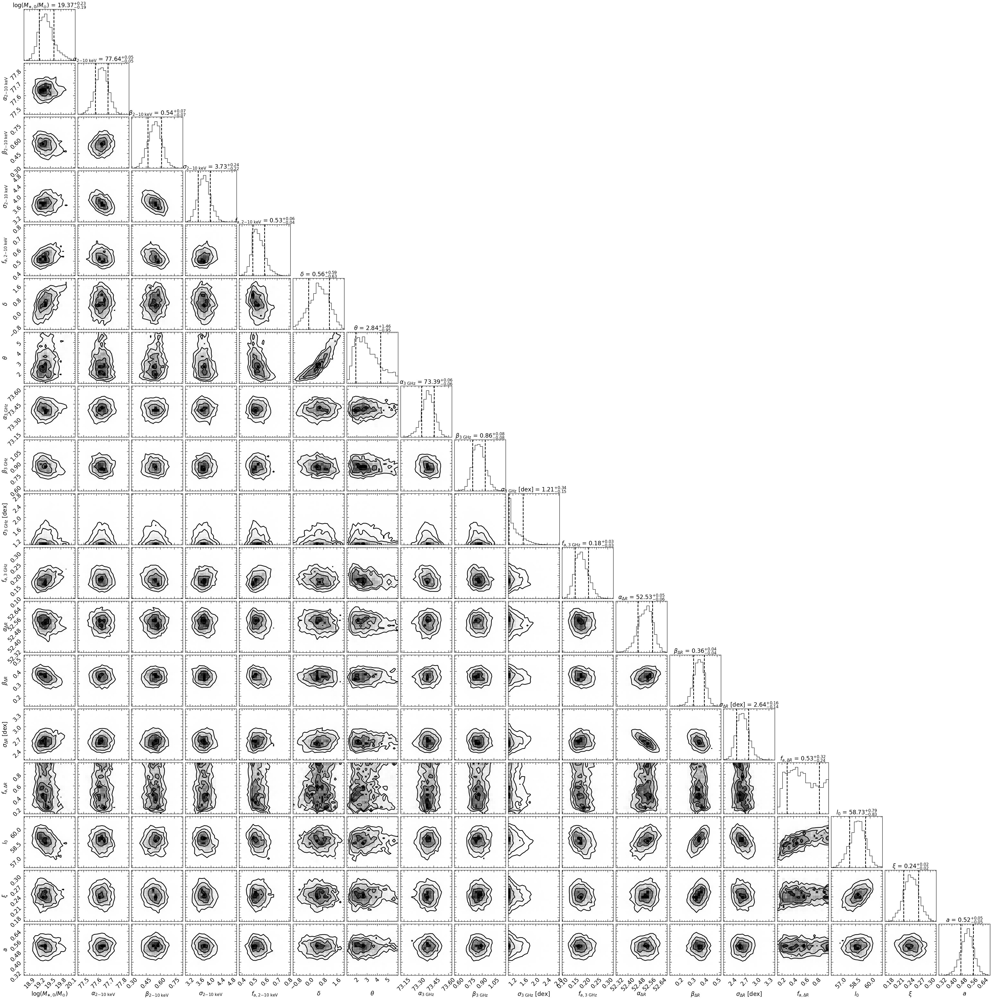

In [102]:

flat_samples[:,0] += 10
flat_samples[:,1] += 39
flat_samples[:,3] = np.exp(2*flat_samples[:,3])
flat_samples[:,9] = np.exp(2*flat_samples[:,9])
flat_samples[:,13] = np.exp(2*flat_samples[:,13])

flat_samples[:,7] += 37
flat_samples[:,11] += 26.5
flat_samples[:,15] += 26.5

fig_corner = corner.corner(flat_samples, labels=labels, quantiles=[0.16, 0.84], show_titles=True, color='k', plot_datapoints=False)

In [103]:
fig_corner.savefig('cornermultiwavelength.pdf')

In [33]:
samples.shape

(10000, 48, 18)

In [38]:
len(flat_samples)

67200

(47424, 18)


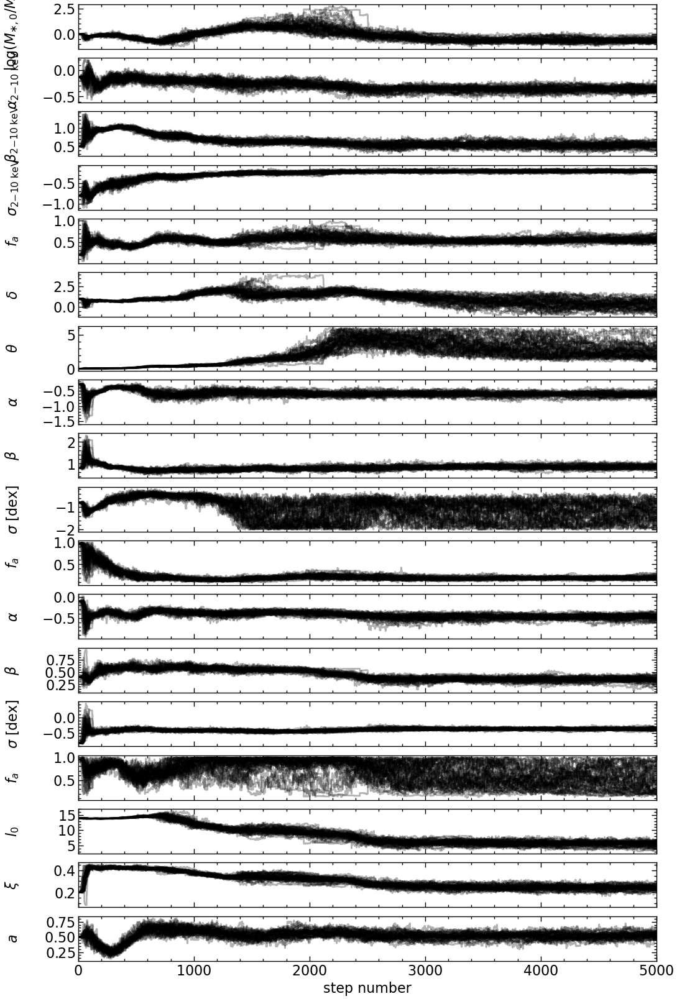

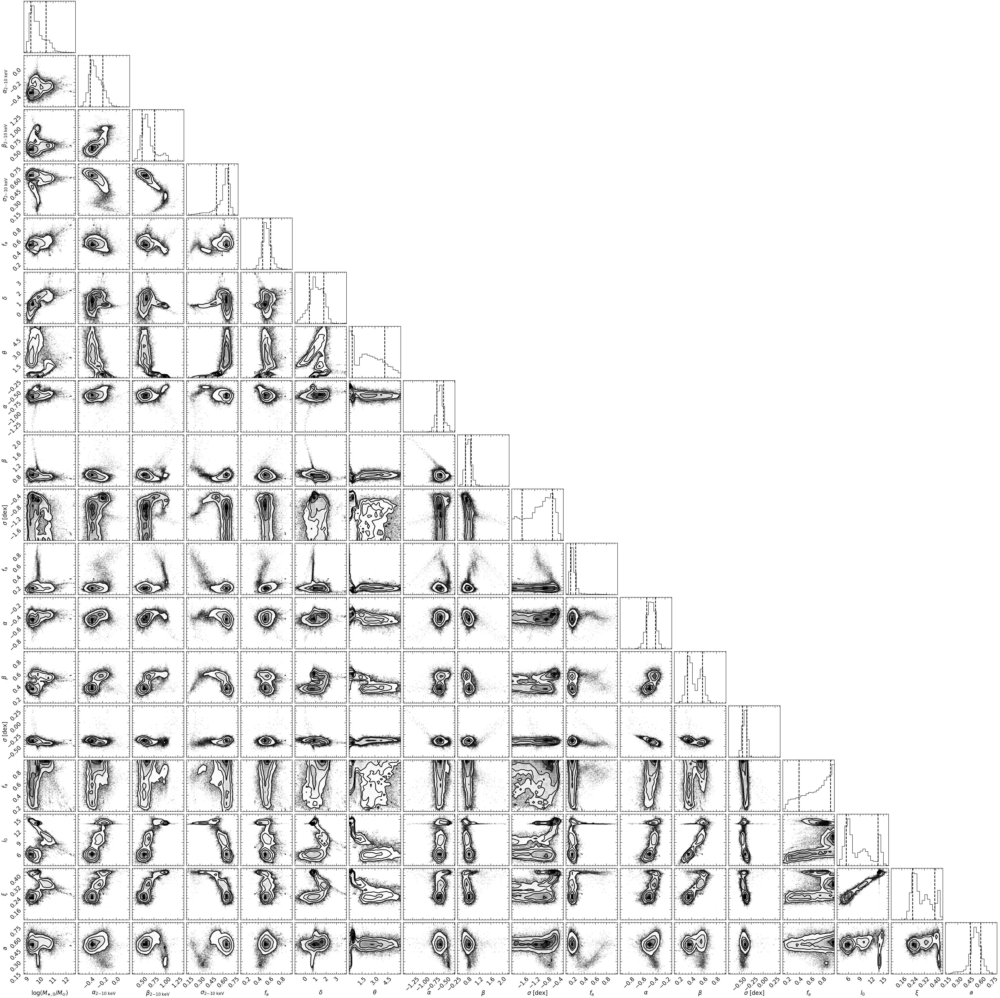

In [87]:
# Plot
fig, axes = plt.subplots(ndim, figsize=(12, 20), sharex=True)
samples = sampler.get_chain()

flat_samples = sampler.get_chain(discard=60, thin=5, flat=True)
print(flat_samples.shape)

# logms0, alpha, beta, log_f, f_a, l0, xi, a, s 
labels = [r"$\log(M_{\ast,0}/M_{\odot})$", r"$\alpha_{2{-}10\ {\rm keV}}$", r"$\beta_{2{-}10\ {\rm keV}}$", r"$\sigma_{2{-}10\ {\rm keV}}$", r'$f_a$', r'$\delta$', r'$\theta$', r"$\alpha$", r"$\beta$", r"$\sigma$ [dex]", r'$f_a$', r"$\alpha$", r"$\beta$", r"$\sigma$ [dex]", r'$f_a$', r'$l_0$', r'$\xi$', r'$a$']

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

#tau = sampler.get_autocorr_time()
#print(tau)

# Corner
flat_samples[:,3] = np.exp(2*flat_samples[:,3]) # sigma
#flat_samples[:,4] = np.exp(2*flat_samples[:,4])
flat_samples[:,0] += 10 # log M_*,0
#flat_samples[:,1] += yp # alpha
#flat_samples[:,5] += yp # l0x
fig_corner = corner.corner(flat_samples, labels=labels, quantiles=[0.16, 0.84], color='k')
#fig_corner.savefig('cornermultiwavelength.pdf', dpi=300)


### Occupation Fraction Comparison

9.322513397000005
(19200, 18)


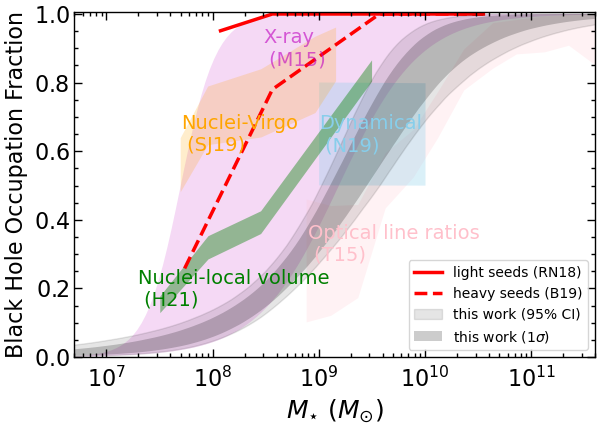

In [98]:
# From Hadair 2022
dat_trump = ascii.read('trump15.txt')
dat_nyguen = ascii.read('nguyen18.txt')
dat_sanchezjansser = ascii.read('sanchez-jansser19.txt')
dat_hoyer = ascii.read('hoyer21.txt')

# Freem Greene 2020
dat_greene = ascii.read('models.txt')

fig, ax = plt.subplots(1, 1, figsize=(6.2, 4.5))
ax.set_xscale('log')

# Plot the z=0 LISA band
ax.fill_between(10**dat_trump['col1'][:12], dat_trump['col2'][:12], dat_trump['col2'][12:], color='pink', alpha=0.2, lw=0)
ax.fill_between(10**dat_nyguen['col1'][:2], dat_nyguen['col2'][:2], dat_nyguen['col2'][2:], color='skyblue', alpha=0.3, lw=0)
ax.fill_between(10**dat_sanchezjansser['col1'][:5], dat_sanchezjansser['col2'][:5], dat_sanchezjansser['col2'][5:], color='orange', alpha=0.2, lw=0)
ax.fill_between(10**dat_hoyer['col1'][:4], dat_hoyer['col2'][:4], dat_hoyer['col2'][4:][::-1], color='green', alpha=0.4, lw=0)

# Labels
#ax.text(6e6, 0.8, 'this work', fontsize=17, color='black', alpha=0.6)
ax.text(5e7, 0.6, 'Nuclei-Virgo\n (SJ19)', fontsize=14, color='orange')
ax.text(1e9, 0.6, 'Dynamical\n (N19)', fontsize=14, color='skyblue')
ax.text(8e8, 0.28, 'Optical line ratios\n (T15)', fontsize=14, color='pink')
ax.text(2e7, 0.15, 'Nuclei-local volume\n (H21)', fontsize=14, color='green')
ax.text(3e8, 0.85, 'X-ray\n (M15)', fontsize=14, color='m', alpha=0.6)


ax.plot(10**dat_greene['col1'][:3], dat_greene['col2'][:3], color='r', zorder=1, lw=2.5, label='light seeds (RN18)')
ax.plot(10**dat_greene['col1'][3:7], dat_greene['col2'][3:7], color='r', zorder=1, lw=2.5, linestyle='dashed', label='heavy seeds (B19)')
#ax.plot(10**dat_greene['col1'][7:], dat_greene['col2'][7:], color='k', zorder=1)

xp = 10
x_eval = np.linspace(-5, 3, 200) + xp

#flat_samples = flat_samples[:-2000,:]

# Occupation fraction
foccs = np.zeros([len(flat_samples), len(x_eval)])
for i, s in enumerate(flat_samples):
    xii = np.exp(s[5])
    theta2i = s[6]
    foccs[i,:] =  1/(1 + xii * np.exp(-theta2i*(x_eval - s[0])))**(1/xii)

print(s[0])
print(np.shape(flat_samples))

ax.fill_between(10**x_eval, 0.5 + 0.5*np.tanh(2.5**np.abs(8.9 - 7.70)*np.log10(10**x_eval/10**7.70)),
                0.5 + 0.5*np.tanh(2.5**np.abs(8.9 - 9.19)*np.log10(10**x_eval/10**9.19)), color='m', lw=0, alpha=0.15, zorder=-10)

ax.fill_between(10**x_eval, np.percentile(foccs, 5, axis=0), np.percentile(foccs, 95, axis=0),
                color='k', lw=1, alpha=0.1, label=r'this work (95% CI)')
ax.fill_between(10**x_eval, np.percentile(foccs, 16, axis=0), np.percentile(foccs, 84, axis=0),
                color='k', lw=0, alpha=0.2, label=r'this work (1$\sigma$)')

ax.legend(fontsize=10, frameon=True, loc=4)

ax.set_ylim(0, 1.005)
ax.set_xlim(5e6, 4e11)

ax.set_xlabel(r'$M_{\star}\ (M_{\odot})$', fontsize=18)
ax.set_ylabel(r'Black Hole Occupation Fraction', fontsize=16)

ax.tick_params(axis='x', which='major', pad=7)

fig.tight_layout()
fig.savefig('occupationcombined.pdf', dpi=300)

In [32]:
flat_samples[:2000,:].shape

(61200, 18)

In [99]:
print(np.interp(9, x_eval, np.percentile(foccs, 5, axis=0)))

print(np.interp(8, x_eval, np.percentile(foccs, 5, axis=0)))

0.2710170276656066
0.04543867726269555


In [100]:
print(np.interp(9, x_eval, np.percentile(foccs, 95, axis=0)))

print(np.interp(8, x_eval, np.percentile(foccs, 95, axis=0)))

0.4831623435825423
0.1363737033442417


In [50]:
def logGSMF_blue(M_star):
    """
    Galaxy stellar mass function of the z ~ 0 blue+green galaxy population (single Schechter function)
    https://ui.adsabs.harvard.edu/abs/2012MNRAS.421..621B/abstract
    """
    M_br = 10**10.72
    phi = 0.71*1e-3
    alpha = -1.45
    phi = np.log(10) * np.exp(-M_star/M_br) * phi*(M_star/M_br)**(alpha+1)
    return phi

def logGSMF_red(M_star):
    """
    Galaxy stellar mass function of the z ~ 0 red galaxy population (double Schechter function)
    https://ui.adsabs.harvard.edu/abs/2012MNRAS.421..621B/abstract
    """
    M_br = 10**10.72
    phi1 = 3.25*1e-3
    phi2 = 0.08*1e-3
    alpha1 = -0.45
    alpha2 = -1.45
    phi = np.log(10) * np.exp(-M_star/M_br) * (phi1*(M_star/M_br)**(alpha1+1) + phi2*(M_star/M_br)**(alpha2+1))
    return phi

In [51]:
def logGSMF(M_star, size=1):
    """
    Galaxy stellar mass function of the z ~ 0 blue+green galaxy population (single Schechter function)
    https://ui.adsabs.harvard.edu/abs/2012MNRAS.421..621B/abstract
    """
    logM_br = 10.78
    dlogM_br = 0.01
    
    phi1 = 2.96*1e-3
    dphi1 = 0.40*1e-3
    
    phi2 = 0.63*1e-3
    dphi2 = 0.10*1e-3
    
    alpha1 = -0.62
    dalpha1 = 0.03
    
    alpha2 = -1.50
    dalpha2 = 0.01
    
    M_br = 10**np.random.normal(loc=logM_br, scale=dlogM_br, size=size)
    phi1 = np.random.normal(loc=phi1, scale=dphi1, size=size)
    
    phi2 = np.random.normal(loc=phi2, scale=dphi2, size=size)
    
    alpha1 = np.random.normal(loc=alpha1, scale=dalpha1, size=size)
    alpha2 = np.random.normal(loc=alpha2, scale=dalpha2, size=size)

    # dN/dlogM
    phi = np.log(10) * np.exp(-M_star/M_br) * (phi1*(M_star/M_br)**(alpha1+1) + phi2*(M_star/M_br)**(alpha2+1))
    
    return phi

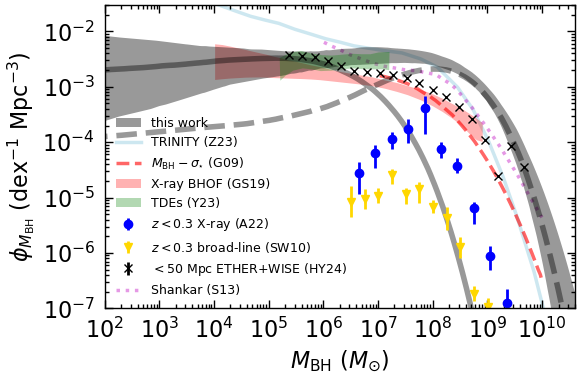

In [94]:
fig2, ax2 = plt.subplots(1, 1, figsize=(6, 4.0))
ax2.set_xscale('log')
ax2.set_yscale('log')

# grid
dlogm = .01
logms = np.arange(2.0, 16.5, dlogm)
ms = 10**logms
dms = np.diff(ms)

Nsamp = 200 

gsmf = np.zeros([len(logms), Nsamp])
gsmf_blue = np.zeros([len(logms), Nsamp])
gsmf_red = np.zeros([len(logms), Nsamp])

# BHOF should not depend on galaxy color type
bhmf = np.zeros([len(logms), Nsamp])
bhmf_blue = np.zeros([len(logms), Nsamp])
bhmf_red = np.zeros([len(logms), Nsamp])


for i in range(Nsamp):

    # total BH mass function is dominated by early population
    # GSH20, early-type / E, limits
    alpha_red = np.random.normal(7.89, 0.09, size=1)
    beta_red = np.random.normal(1.33, 0.12, size=1)
    sigma_red = np.random.normal(0.65-0.3, 0.05, size=1)
    #sigma_red = np.random.normal(0.05, 0.005, size=1)
    logms0_red = np.log10(3*1e10)

    # grid
    logmb_red = alpha_red + beta_red*(logms - logms0_red)
    mb_red = 10**logmb_red
    dmb_red = np.diff(mb_red)

    # BH mass - stellar mass relation
    # RV15 / similar to GSH20, early-type
    alpha_blue = np.random.normal(7.45, 0.08, size=1)
    beta_blue = np.random.normal(1.05, 0.11, size=1)
    sigma_blue = np.random.normal(0.55-0.3, 0.02, size=1) # Assume 10% error on scatter - 0.3
    #sigma_blue = np.random.normal(0.05, 0.005, size=1) # Assume 10% error on scatter
    logms0_blue = 11

    # Inactive E RV15
    #alpha_blue = np.random.normal(8.95, 0.08, size=1)
    #sigma_blue = np.random.normal(0.47, 0.02, size=1) # Assume 10% error on scatter - 0.3
    #beta_blue = np.random.normal(0.8, 0.11, size=1)

    # grid
    logmb_blue = alpha_blue + beta_blue*(logms - logms0_blue)
    mb_blue = 10**logmb_blue
    dmb_blue = np.diff(mb_blue)

    # LX - Ms relation
    alpha_l = flat_samples[i,1]
    beta_l = flat_samples[i,2]
    sigma_l = flat_samples[i,3]
    fa = flat_samples[i,4]
    logms0_l = np.log10(3*1e10)
    
    logl = alpha_l + beta_l*(logms - 10)
    l = 10**logl
    dl = np.diff(l)
    dlogl = np.diff(logl)[0]

    gsmf[:,i] = logGSMF(ms)
    gsmf_blue[:,i] = logGSMF_blue(ms)
    gsmf_red[:,i] = logGSMF_red(ms)

    # Convolve
    xii = np.exp(flat_samples[i,5])
    theta2i = flat_samples[i,6]
    x50i = flat_samples[i,0]
    focci = 1/(1 + xii * np.exp(-theta2i*(logms - x50i)))**(1/xii)
    #focci = 1 # test

    bhmf_blue[:,i] = np.array([np.trapz(focci * gsmf_blue[:,i] * st.norm.pdf(logmbi-logms, loc=logmb_blue-logms, scale=sigma_blue)*dlogm) for logmbi in logmb_blue])
    bhmf_red[:,i] = np.array([np.trapz(focci * gsmf_red[:,i] * st.norm.pdf(logmbi-logms, loc=logmb_red-logms, scale=sigma_red)*dlogm) for logmbi in logmb_red])
    bhmf[:,i] = np.array([np.trapz(focci * gsmf[:,i] * st.norm.pdf(logmbi-logms, loc=logmb_red-logms, scale=sigma_red)*dlogm) for logmbi in logmb_red])

color='k'

# already put dm above!!
ax2.plot(mb_blue[:-1], np.percentile(bhmf_blue[:-1], 50, axis=1), # * dlogm,
        color=color, lw=4, linestyle='solid', alpha=0.4) #, label='late-type (this work)')
ax2.plot(mb_red[:-1], np.percentile(bhmf_red[:-1], 50, axis=1), # * dlogm,
        color=color, lw=4, linestyle='dashed', alpha=0.4) #, label='early-type (this work)')
ax2.fill_between(mb_red[:-1], np.percentile(bhmf[:-1], 5, axis=1), # * dlogm,
                 np.percentile(bhmf[:-1], 95, axis=1), color=color, alpha=0.4, lw=0, label='this work')


# Active fraction too
#ax2.fill_between(mb[:-1], np.percentile(bhmf[:-1], 16, axis=1) * dlogm,
#                 np.percentile(bhmf[:-1], 84, axis=1) * dlogm)

#x_eval_tde = np.logspace(5.1, 8.2, 10)
#ax2.plot(x_eval_tde, 5e-4*(x_eval_tde/1e7)**-0.25, linestyle='-.', color='green', label='TDEs (Y23)', alpha=0.8)

ax2.set_ylim(1e-7, 3e-2)
ax2.set_xlim(1e2, 4e10)
ax2.set_xlabel(r'$M_{\rm{BH}}\ (M_{\odot})$')
ax2.set_ylabel(r'$\phi_{M_{\rm{BH}}}$ (dex$^{-1}$ Mpc$^{-3})$')

dat = ascii.read('annana_bhmf_dat.txt')
dat_hi = ascii.read('annana_bhmf_up.txt')
dat_lo = ascii.read('annana_bhmf_lo.txt')
errs = np.abs([dat_hi['col2'] - dat['col2'], dat['col2'] - dat_lo['col2']])*10**dat['col2']/0.434

ax2.errorbar(10**dat['col1'], 10**dat['col2'], yerr=errs,
        color='blue', linestyle='none', marker='o', label='$z<0.3$ X-ray (A22)')

dat = ascii.read('schulze.dat')[::-1]
dat_hi = ascii.read('schulze_hi.dat')
dat_lo = ascii.read('schulze_lo.dat')
errs = np.abs([dat_hi['col2'] - dat['col2'], dat['col2'] - dat_lo['col2']])*10**dat['col2']/0.434

ax2.errorbar(10**dat['col1'], 10**dat['col2'], yerr=errs,
        color='gold', linestyle='none', marker='v', label=r'$z<0.3$ broad-line (SW10)')

dat = ascii.read('gh07.txt')
dat_hi = ascii.read('gh07_hi.txt')
dat_lo = ascii.read('gh07_lo.txt')
errs = np.abs([dat_hi['col2'] - dat['col2'], dat['col2'] - dat_lo['col2']])*10**dat['col2']/0.434

dat = ascii.read('ether.txt')
ax2.errorbar(10**dat['col1'], dat['col2'], yerr=0,
        color='k', linestyle='none', marker='x', label=r'$<50$ Mpc ETHER+WISE (HY24)')

#ax2.errorbar(10**dat['col1'], 10**dat['col2'], yerr=errs,
#        color='forestgreen', linestyle='none', marker='s', label='Green \& Ho 2007 ($z < 0.352$)')

dat = ascii.read('shankar.txt')
ax2.errorbar(10**dat['col1'], 10**dat['col2'], linestyle='dotted', color='m', label='Shankar (S13)', lw=2.5, zorder=-1, alpha=0.4)

dat = ascii.read('trinity.txt')
ax2.plot(dat['col1'], -dat['col2'], linestyle='solid',
             color='lightblue', label='TRINITY (Z23)', lw=2.5, zorder=-1, alpha=0.6)


dat = ascii.read('gultiken2.txt')
ax2.plot(10**dat['col1'], 10**dat['col2'], linestyle='dashed',
             color='red', label=r'$M_{\rm{BH}}-\sigma_{\star}$ (G09)', lw=2.5, zorder=-1, alpha=0.6)

dat_hi = ascii.read('gallo_hi.txt')
dat = ascii.read('gallo_lo.txt')
ax2.fill_between(dat_hi['col1'], dat_hi['col2'], np.interp(dat_hi['col1'], dat['col1'], dat['col2']),
                 color='r', lw=0, zorder=-1, alpha=0.3, label='X-ray BHOF (GS19)')

from matplotlib.patches import Polygon
dat = ascii.read('yao.txt')
f = np.array([10**dat['col1'].data, dat['col2'].data])
p = Polygon(f.T, facecolor='green', alpha=0.3, label='TDEs (Y23)')
ax2.add_patch(p)

# Axis
locmaj = matplotlib.ticker.LogLocator(base=10,numticks=14) 
ax2.xaxis.set_major_locator(locmaj)
locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),numticks=14)
ax2.xaxis.set_minor_locator(locmin)
ax2.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax2.tick_params(axis='x', which='major', pad=7)

locmaj = matplotlib.ticker.LogLocator(base=10,numticks=14) 
ax2.yaxis.set_major_locator(locmaj)
locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),numticks=14)
ax2.yaxis.set_minor_locator(locmin)
ax2.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax2.tick_params(axis='y', which='major', pad=7)

ax2.legend(fontsize=9, loc='lower left')

# seperate legend for this work
# TODO: ERDF might differ for early and late types / color (gives trend with mass)

fig2.tight_layout()
fig2.savefig('bhmfcombined.pdf', dpi=300)